## This data exploratory notebook is adapted from [TACO Toolkit](https://github.com/pedropro/TACO)

# TACO Inspection Demo

This notebook contains several independent scripts that show how to load and visualize the dataset stats and annotated images:
- Section 1 shows the dataset stats
- Section 2 show the class hierarchical structure: super classes and classes
- Section 3 shows TACO images along with their segmentation masks

But first we need to load the annotations and some python libraries:

In [1]:
%matplotlib inline
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

dataset_path = '../data'
anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


In [2]:
dataset.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

In [3]:
len(dataset['categories'])

60

In [4]:
'batch_1/000006.jpg'

'batch_1/000006.jpg'

In [5]:
dataset['images'][-1]

{'id': 1499,
 'width': 1824,
 'height': 4000,
 'file_name': 'batch_9/000099.jpg',
 'license': 'CC',
 'flickr_url': 'https://farm66.staticflickr.com/65535/48701147541_75b5ee2c81_o.png',
 'flickr_640_url': 'https://farm66.staticflickr.com/65535/48701147541_801c1a9f15_z.jpg',
 'coco_url': None,
 'date_captured': None}

In [6]:
dataset['annotations'][-1]

{'id': 4783,
 'image_id': 1499,
 'category_id': 6,
 'segmentation': [[1125,
   1937,
   1135,
   2012,
   1194,
   2013,
   1221,
   2015,
   1258,
   1994,
   1267,
   1960,
   1321,
   1950,
   1316,
   1883,
   1289,
   1860,
   1252,
   1858,
   1232,
   1862,
   1181,
   1891],
  [1140,
   2103,
   1149,
   2163,
   1183,
   2215,
   1178,
   2243,
   1180,
   2278,
   1141,
   2284,
   1159,
   2344,
   1158,
   2368,
   1209,
   2368,
   1241,
   2354,
   1290,
   2349,
   1333,
   2362,
   1359,
   2350,
   1351,
   2286,
   1347,
   2214,
   1335,
   2164,
   1329,
   2103,
   1303,
   2096,
   1293,
   2132,
   1269,
   2113,
   1225,
   2121,
   1182,
   2116,
   1166,
   2097,
   1165,
   2079,
   1157,
   2059,
   1181,
   2047,
   1138,
   2036]],
 'area': 68589.5,
 'bbox': [1125.0, 1858.0, 234.0, 510.0],
 'iscrowd': 0}

In [7]:
dataset['categories']

[{'supercategory': 'Aluminium foil', 'id': 0, 'name': 'Aluminium foil'},
 {'supercategory': 'Battery', 'id': 1, 'name': 'Battery'},
 {'supercategory': 'Blister pack', 'id': 2, 'name': 'Aluminium blister pack'},
 {'supercategory': 'Blister pack', 'id': 3, 'name': 'Carded blister pack'},
 {'supercategory': 'Bottle', 'id': 4, 'name': 'Other plastic bottle'},
 {'supercategory': 'Bottle', 'id': 5, 'name': 'Clear plastic bottle'},
 {'supercategory': 'Bottle', 'id': 6, 'name': 'Glass bottle'},
 {'supercategory': 'Bottle cap', 'id': 7, 'name': 'Plastic bottle cap'},
 {'supercategory': 'Bottle cap', 'id': 8, 'name': 'Metal bottle cap'},
 {'supercategory': 'Broken glass', 'id': 9, 'name': 'Broken glass'},
 {'supercategory': 'Can', 'id': 10, 'name': 'Food Can'},
 {'supercategory': 'Can', 'id': 11, 'name': 'Aerosol'},
 {'supercategory': 'Can', 'id': 12, 'name': 'Drink can'},
 {'supercategory': 'Carton', 'id': 13, 'name': 'Toilet tube'},
 {'supercategory': 'Carton', 'id': 14, 'name': 'Other carton'

In [8]:
cat_list=[]
for i in dataset['categories']:
    cat_list.append(i['name'])
cat_list

['Aluminium foil',
 'Battery',
 'Aluminium blister pack',
 'Carded blister pack',
 'Other plastic bottle',
 'Clear plastic bottle',
 'Glass bottle',
 'Plastic bottle cap',
 'Metal bottle cap',
 'Broken glass',
 'Food Can',
 'Aerosol',
 'Drink can',
 'Toilet tube',
 'Other carton',
 'Egg carton',
 'Drink carton',
 'Corrugated carton',
 'Meal carton',
 'Pizza box',
 'Paper cup',
 'Disposable plastic cup',
 'Foam cup',
 'Glass cup',
 'Other plastic cup',
 'Food waste',
 'Glass jar',
 'Plastic lid',
 'Metal lid',
 'Other plastic',
 'Magazine paper',
 'Tissues',
 'Wrapping paper',
 'Normal paper',
 'Paper bag',
 'Plastified paper bag',
 'Plastic film',
 'Six pack rings',
 'Garbage bag',
 'Other plastic wrapper',
 'Single-use carrier bag',
 'Polypropylene bag',
 'Crisp packet',
 'Spread tub',
 'Tupperware',
 'Disposable food container',
 'Foam food container',
 'Other plastic container',
 'Plastic glooves',
 'Plastic utensils',
 'Pop tab',
 'Rope & strings',
 'Scrap metal',
 'Shoe',
 'Squeez

In [9]:
dataset['categories'][0]['id']

0

In [10]:
dataset['scene_categories']

[{'id': 0, 'name': 'Clean'},
 {'id': 1, 'name': 'Indoor, Man-made'},
 {'id': 2, 'name': 'Pavement'},
 {'id': 3, 'name': 'Sand, Dirt, Pebbles'},
 {'id': 4, 'name': 'Trash'},
 {'id': 5, 'name': 'Vegetation'},
 {'id': 6, 'name': 'Water'}]

In [11]:
dataset['images'][0]['file_name']

'batch_1/000006.jpg'

In [12]:
dataset['categories'][1]

{'supercategory': 'Battery', 'id': 1, 'name': 'Battery'}

### Exploratory comments on Dataset

json file is a dictionary with keys\
dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

info is some basic info on the dataset\
{'year': 2019,
 'version': None,
 'description': 'TACO',
 'contributor': None,
 'url': None,
 'date_created': '2019-12-19T16:11:15.258399+00:00'}
 
 within images resides a list of all the images descriptors and attributes\
 e.g. first item in the images list\
 {'id': 0,
 'width': 1537,
 'height': 2049,
 'file_name': 'batch_1/000006.jpg',
 'license': None,
 'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png',
 'coco_url': None,
 'date_captured': None,
 'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'}

within annotations resides a list of all the corresponding annotations for each image in the same order\
there is a mapped image id, category id, with segmentation coordinates for object segmentation, also a bbox or boundary box\
e.g. first annotation in the annotations list\
{'id': 1,
 'image_id': 0,
 'category_id': 6,
 'segmentation': [[561.0,
   1238.0,
   ...
   1238.0]],
 'area': 403954.0,
 'bbox': [517.0, 127.0, 447.0, 1322.0],
 'iscrowd': 0}
 
within scene_annotations resides a list of background_ids (e.g. beach, roads, etc) probably not relevant in my specific case\
e.g. first scene_annotation in the scene_annotations list\
{'image_id': 0, 'background_ids': [1]}

within categories reside a list of mapped supercategory and a subset category\
there are 60 categories\
e.g. first category item\
{'supercategory': 'Aluminium foil', 'id': 0, 'name': 'Aluminium foil'}

ditto for scene_categories
there are 7 scene_categories

## 1.  Dataset statistics

This shows the number of annotations per category:

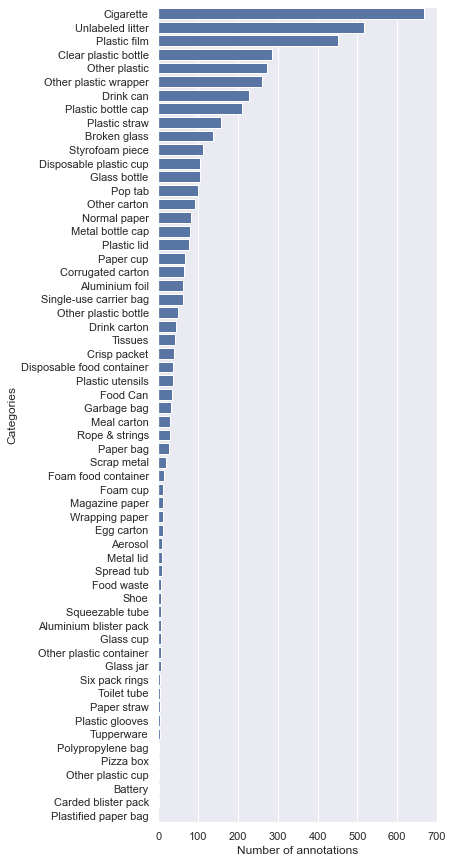

In [13]:
# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values(by='Number of annotations', axis=0, ascending=False)

# Plot the histogram
# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b")

# fig = plot_1.get_figure()
# fig.savefig("output.png")

and this shows the number of annotations per super category:

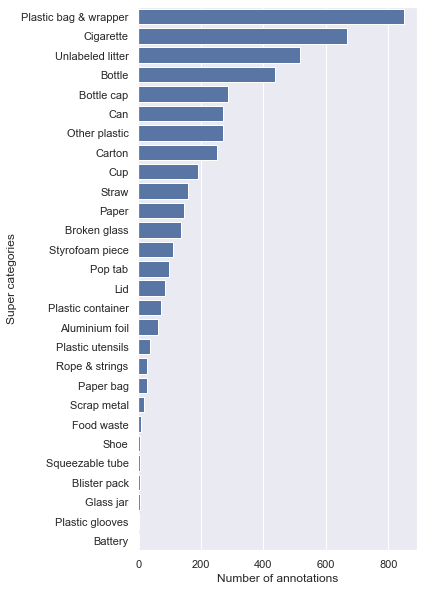

In [14]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values(by='Number of annotations', axis=0, ascending=False)

# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b")
#plot_1.set_title('Annotations per super category',fontsize=20)   

### 1.1  Background stats

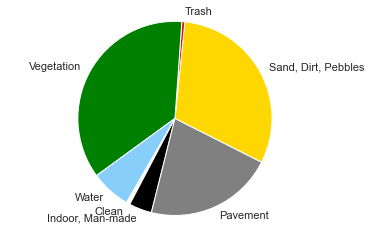

In [15]:
# Get scene cat names
scene_cats = dataset['scene_categories']
scene_name = []
for scene_cat in scene_cats:
    scene_name.append(scene_cat['name'])

nr_scenes = len(scene_cats)
scene_cat_histogram = np.zeros(nr_scenes,dtype=int)

for scene_ann in dataset['scene_annotations']:    
    scene_ann_ids = scene_ann['background_ids']
    for scene_ann_id in scene_ann_ids:
        if scene_ann_id<len(scene_cats):
            scene_cat_histogram[scene_ann_id]+=1

# Convert to DataFrame
df = pd.DataFrame({'scene_cats': scene_cats, 'nr_annotations': scene_cat_histogram})
 
# Plot
colors = ['white','black','gray', 'gold', 'red','green','lightskyblue']
plt.pie(scene_cat_histogram, labels=scene_name, colors = colors,
      shadow=False, startangle=-120)
 
plt.axis('equal')
plt.show()

## 2. Visualize dataset graph

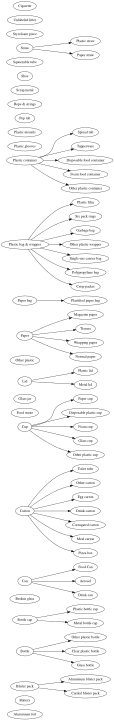

In [16]:
from graphviz import Digraph
# Note: graphviz may require more than pip installation due to path issue: e.g. brew install graphviz for mac

#g = Digraph('G', filename='hello.gv')
dot = Digraph('Dataset graph', filename='asd.gv')
dot.attr(rankdir='LR', size='8,10')

for cat_it in categories:
    dot.node(cat_it['name'])
    if cat_it['name']==cat_it['supercategory']:
        dot.node(cat_it['supercategory'])
    else:
        dot.edge(cat_it['supercategory'], cat_it['name'])
dot
# Uncomment next line to print pdf
#dot.view()

## 3. Visualize Annotated Images

For simplicity, to select and show the dataset images with the respective masks, we make use of the COCO API.
The script below shows how to load and visualize an image with all its annotations.

Unfortunately, several python libraries do not take into account the EXIF orientation tag, thus we have to explicitly rotate the images. Alternatively you can use instead OpenCV.

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!
batch_11/000028.jpg


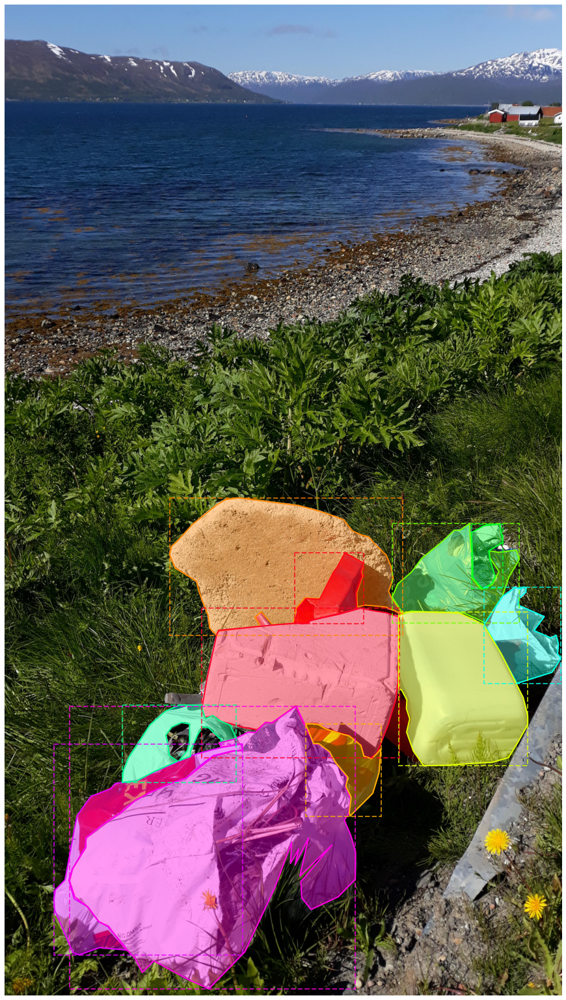

In [17]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
# image_filepath = 'batch_1/000010.jpg'
image_filepath = 'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()



The script below shows how to filter images by either category or supercategory.

Go ahead and try different (super)categories searches by changing the `category_name`.
Note that small objects may be hard to see.

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Number of images found:  151


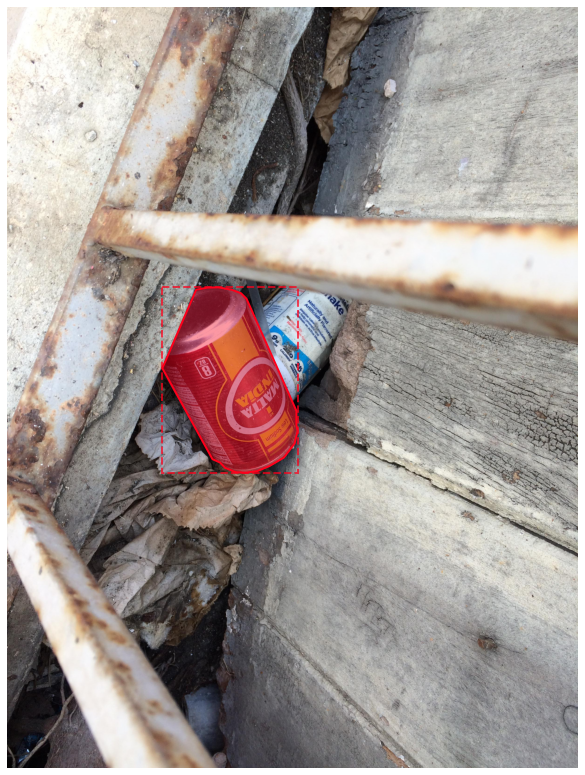

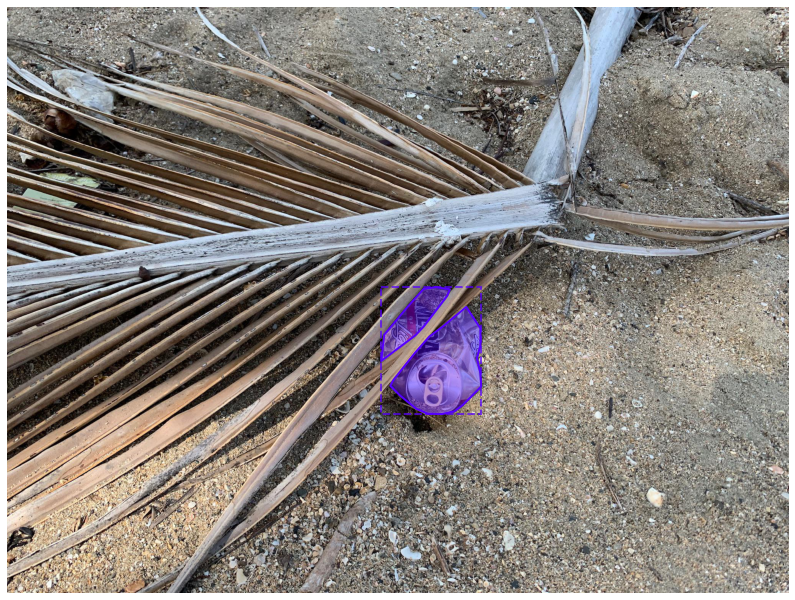

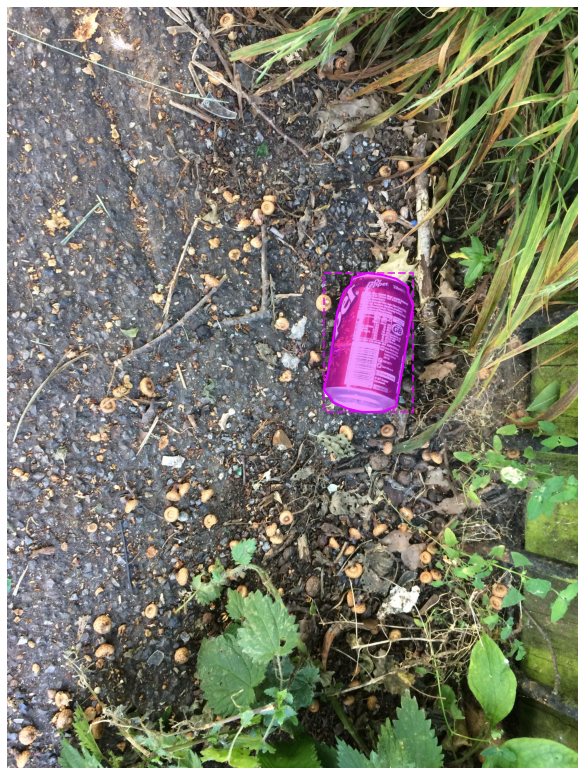

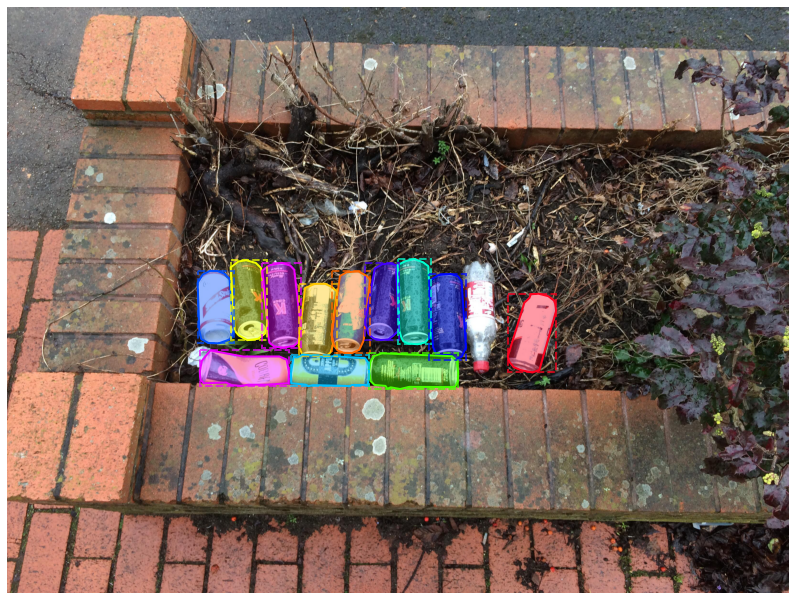

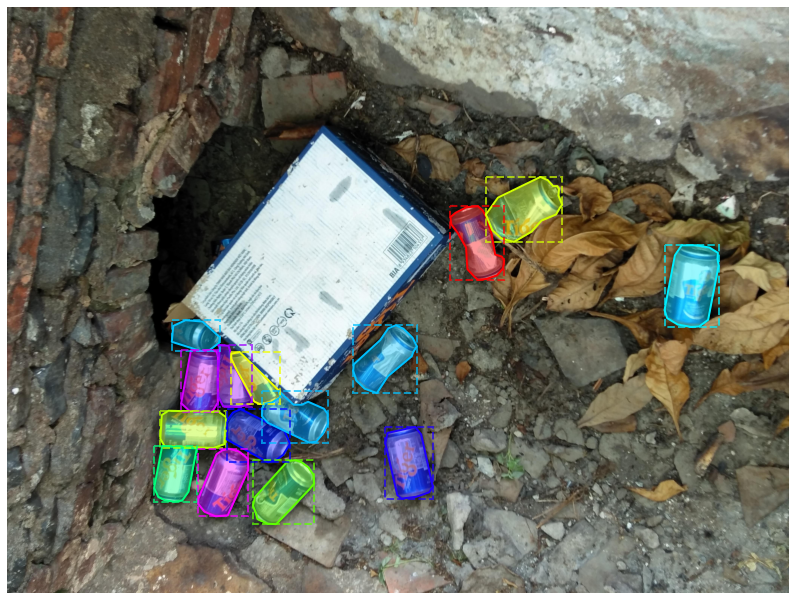

In [18]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
nr_img_2_display = 5
category_name = 'Drink can'#  --- Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds)
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)])

for img in imgs:
    image_path = dataset_path + '/' + img['file_name']
    # Load image
    I = Image.open(image_path)
    
    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)
    
    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()
